In [ ]:
import numpy as np
import cupy as cp
import matplotlib.pyplot as plt
import h5py
# import cv2
from scipy.ndimage import shift,gaussian_filter
from types import SimpleNamespace
from utils import *
from rec import Rec
import pandas as pd
from utils import remove_outliers, mshow, mshow_polar, mshow_complex


### Parameters

In [ ]:
n = 1024  #2048, object size in each dimension used for reconstruction, note initial data will be cropped to nxn before reconstruction
detector_pixelsize = 0.55e-6
energy = 19.55  # [keV] xray energy
wavelength = 1.2398419840550367e-09/energy  # [m] wave length
focusToDetectorDistance = 2.84  # [m]??? could be not accurate
z1 = 0.7 # [m]????? could be not accurate
z2 = focusToDetectorDistance-z1
distances = (z1*z2)/focusToDetectorDistance
magnification = focusToDetectorDistance/z1
voxelsize = np.abs(detector_pixelsize/magnification)  # object voxel size
print(f'{voxelsize=}')


# Read data

In [ ]:
npos = 4 ## Number of CA positions in one direction to use for reconstruction, total number of positions is npos*npos

### Extract data ids

In [ ]:
ids0 = np.arange(225)
ids = np.zeros(npos*npos,dtype='int32')
ss = 8-npos//2
for ky in range(npos):    
    ids[ky*npos:(ky+1)*npos] = ids0[(ss+ky)*15+ss:(ss+ky)*15+ss+npos]
print(ids)

### Read data by ids

In [ ]:
path = f'/data2/maxiv/NTT_SiemensStar_2/'

with h5py.File(f'{path}/scan-3918_orca.h5') as fid:
    data = fid['/entry/instrument/orca/data'][ids].astype('float32')    
with h5py.File(f'{path}/scan-3917_orca.h5') as fid:
    ref = fid['/entry/instrument/orca/data'][:].astype('float32')
with h5py.File(f'{path}/scan-3914_orca.h5') as fid:
    ref0 = fid['/entry/instrument/orca/data'][:].astype('float32')
with h5py.File(f'{path}/scan-3916_orca.h5') as fid:
    siemens_no_code = fid['/entry/instrument/orca/data'][:1].astype('float32')
with h5py.File(f'{path}/scan-3915_orca.h5') as fid:
    dark = fid['/entry/instrument/orca/data'][:].astype('float32')


# Pre-processing

### remove outliers

In [ ]:
data = remove_outliers(data,3,0.9)
dark = remove_outliers(dark,3,0.9)
ref = remove_outliers(ref,3,0.9)
ref0 = remove_outliers(ref0,3,0.9)
siemens_no_code = remove_outliers(siemens_no_code,3,0.9)

mshow(data[0],True)
mshow(ref[0],True)
mshow(dark[0],True)
mshow(ref0[0],True)
mshow(siemens_no_code[0],True)


In [ ]:
dark = np.mean(dark,axis=0)
ref = np.mean(ref,axis=0)
ref0 = np.mean(ref0,axis=0)

# dark field correction
data -= dark
ref -= dark
ref0 -= dark
siemens_no_code -= dark

data[data<0]=0
ref[ref<0]=0
ref0[ref0<0]=0
siemens_no_code[siemens_no_code<0]=0

# normalization
data/=np.mean(ref)
ref0/=np.mean(ref)
siemens_no_code/=np.mean(ref)
ref/=np.mean(ref)


# divide by the MLL wavefront since it is weak
data/=ref0
ref/=ref0
siemens_no_code/=ref0

data[np.isnan(data)] = 1
ref[np.isnan(ref)] = 1
siemens_no_code[np.isnan(siemens_no_code)] = 1
mshow(data[0],True)
mshow(ref,True)
mshow(siemens_no_code[0],True)

### Siemens star seems moving by 6 pixels in horizontal direction

In [ ]:
mshow((data[0]-data[-1])[700:700+1024,1300:1300+1024],True)

### Move it data back and check whether siemens star is visible when taking difference between the first and large frames

In [ ]:
shifts = np.zeros([225,2],dtype='float32') 
shifts[:,1] = np.linspace(0,6,225)
shifts = shifts[ids]
for k in range(data.shape[0]):
    data[k] = shift(data[k],-shifts[k])
mshow((data[0]-data[-1])[700:700+1024,1300:1300+1024],True)

### The siemens star without code should be also shifted to be aligned with the datasets
### It seems the shift is [-3,5]

In [ ]:
siemens_no_code = shift(siemens_no_code[0],[-3,5],mode='nearest')[None]
mshow((data[0]/siemens_no_code[0])[700:700+1024,1300:1300+1024],True)    

### remove siemens star shape from datasets

In [ ]:
rdata = data/siemens_no_code
mshow(rdata[0][700:700+1024,1300:1300+1024],True)  

### to find CA shifts, we reorder datasets so adjacent ones are always closed to each other, we get a 'snake' pattern

In [ ]:
ids = np.arange(npos*npos)
for ky in range(npos):    
    if ky%2==1:
        ids[ky*npos:(ky+1)*npos] = ids[ky*npos:(ky+1)*npos][::-1]    
print(ids)
data = data[ids]
rdata = rdata[ids]

# Find shifts between adjacent frames

### select region which doesnt contain the Siemens star, it contains only CA

In [ ]:
shifts_relative = np.zeros([data.shape[0],2],dtype='float32')

def my_phase_corr(d1, d2):
    image_product = np.fft.fft2(d1) * np.fft.fft2(d2).conj()
    cc_image = np.fft.fftshift(np.fft.ifft2(image_product))
    ind = np.unravel_index(np.argmax(cc_image.real, axis=None), cc_image.real.shape)
    # shifts = np.subtract(ind,d1.shape[-1]//2)
    shifts = np.array(ind)
    shifts[0] = ind[0] - d1.shape[0]//2 
    shifts[1] = ind[1] - d1.shape[1]//2 
    return shifts

ids_res = []
for k in range(0,data.shape[0]-1):         
    tmp1 = rdata[k].copy()
    tmp2 = rdata[k+1].copy()
    tmp1 = gaussian_filter(tmp1,4)
    tmp2 = gaussian_filter(tmp2,4)
    
    shifts_relative[k] = my_phase_corr(tmp1,tmp2)
    
    # check if shift is ok
    # h,w = tmp1.shape
    # nn = 512
    # offset = 3200
    # tmp = rdata[k,h//2-nn//2:h//2+nn//2,w//2-nn//2+offset:w//2+nn//2+offset]
    # tmp1 = rdata[k+1,h//2-nn//2:h//2+nn//2,w//2-nn//2+offset:w//2+nn//2+offset]
    # tmp2 = shift(tmp,-shifts_relative[k])
    # dif = tmp1-tmp2
    # nn = np.linalg.norm(dif[nn//2-nn//8:nn//2+nn//8,nn//2-nn//8:nn//2+nn//8])
    # if nn>8:
    #     print('WARNING')
    #     mshow_complex(tmp1+1j*tmp,True)
    #     mshow_complex(rdata[k]+1j*rdata[k+1],True)
    #     mshow(dif,True,vmax=0.3,vmin=-0.3)
    print(k,shifts_relative[k])



In [ ]:
ipos = npos*npos//2-npos//2*(npos%2==0)# align wrt the middle
shifts = shifts_relative*0
for k in range(ipos):
    shifts[k] = np.sum(shifts_relative[k:ipos],axis=0) 
shifts[ipos] = 0#shifts[ipos]
for k in range(ipos,npos*npos):
    shifts[k] = np.sum(-shifts_relative[ipos:k],axis=0)
plt.plot(shifts[...,0],shifts[...,1],'.')
plt.plot(shifts[ipos,0],shifts[ipos,1],'rx')
plt.grid()


## crop data to size nxn

In [ ]:
offset = -300 # to have siemens star in the middle
data = data[:,data.shape[1]//2-n//2:data.shape[1]//2+n//2,data.shape[2]//2-n//2+offset:data.shape[2]//2+n//2+offset]
mshow(data[0],True)

#### One can do reconstruction by CTF or Paganin to create a good initial guess, in the following we start with probe and object =1

# Iterative reconstruction

We solve 
$$\argmin_{\psi,q,r}\sum_k\|D(q\cdot S_{r_k}(\psi))-d\|_2^2$$
where $q$ is the siemens star, $\psi$ - CA at the siemens star position, $r$ - CA positions

### initialization

In [ ]:
args = SimpleNamespace()

args.ngpus = 4 # number of gpus
args.lam = 0.05 # regularization if results look noisy (for small number of positions)

args.n = n
args.ex = 16 # extra padding for shifts
args.npsi = int(np.ceil((n+2*np.amax(np.abs(shifts))+2*args.ex)/32)*32) # reconstruction size after padding
args.npatch = args.n + 2 * args.ex
args.npos = npos*npos
args.nchunk = 4 # number of frames per gpu

args.voxelsize = voxelsize
args.wavelength = wavelength
args.distance = 0.5229#distance   , seems this one is more accurate since it gives better quality

args.rho = [1, 2, 0.1] ## weights for object,probe and positions correction

args.niter = 513 # number of iterations
args.err_step = 32 # show error step
args.vis_step = 32  # show visualization step

args.path_out = f'/data2/maxiv/NTT_SiemensStar_2/rec/{npos}/'
args.show = True

# create class
cl_rec = Rec(args)

### reconstruction

0) err=2.15488e+05


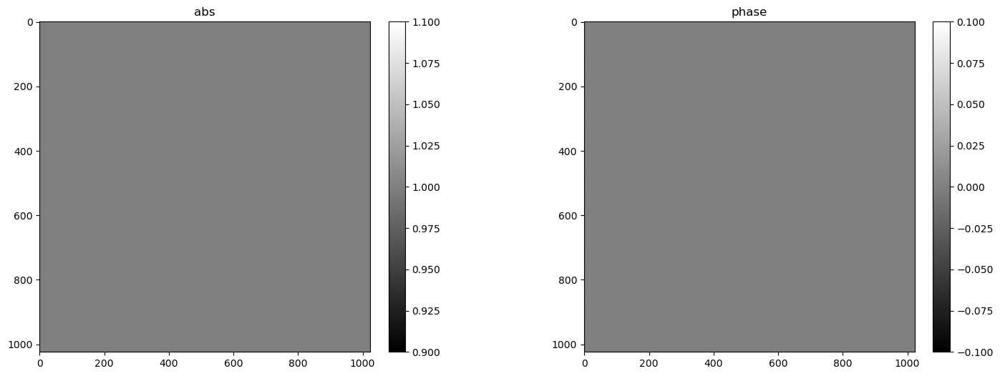

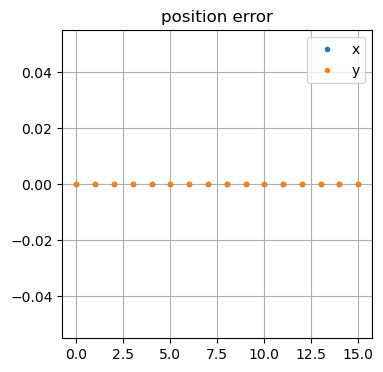

32) err=1.47989e+03


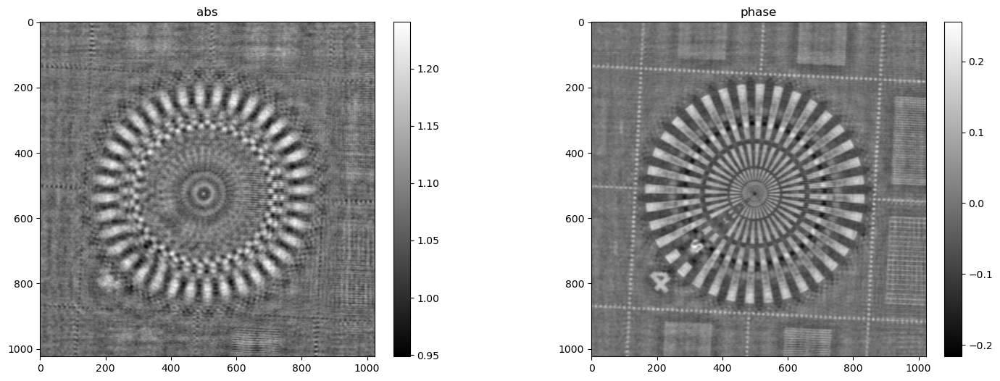

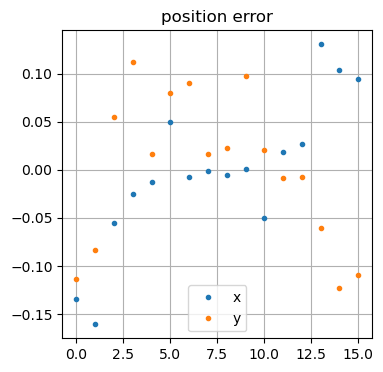

64) err=1.35478e+03


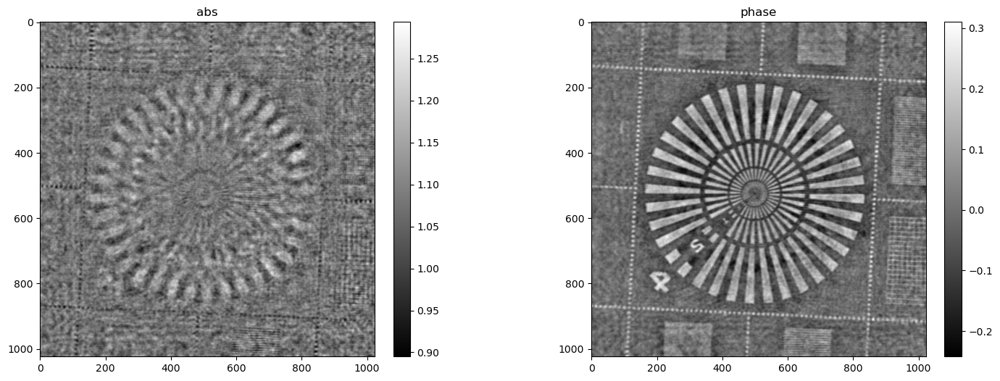

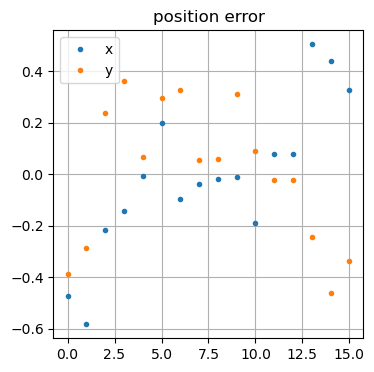

96) err=1.30471e+03


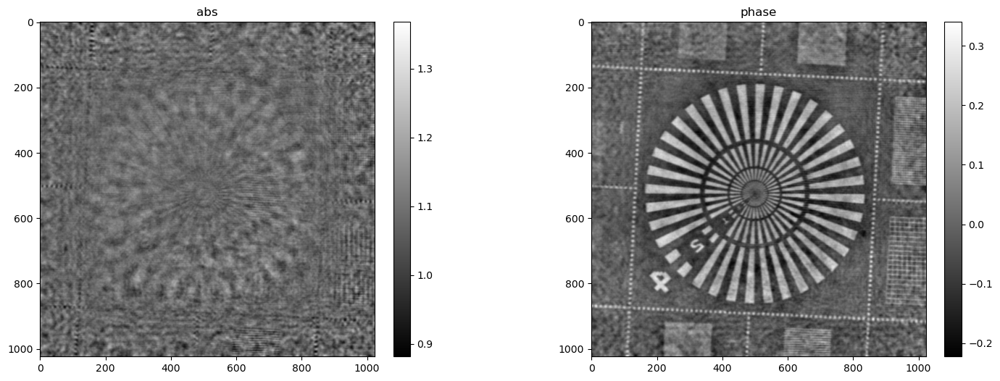

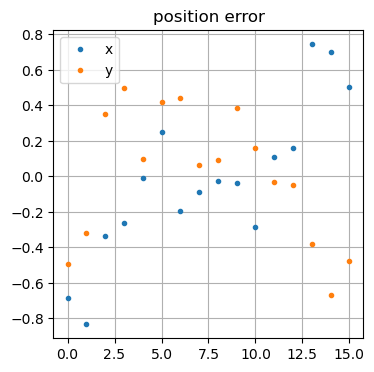

128) err=1.29244e+03


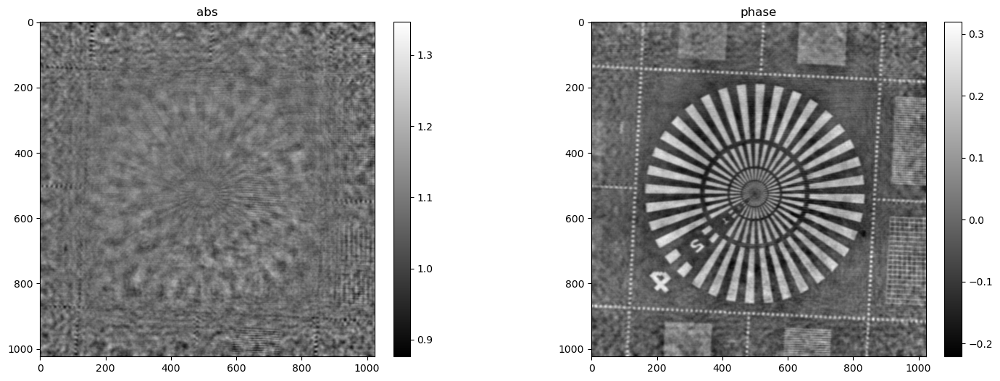

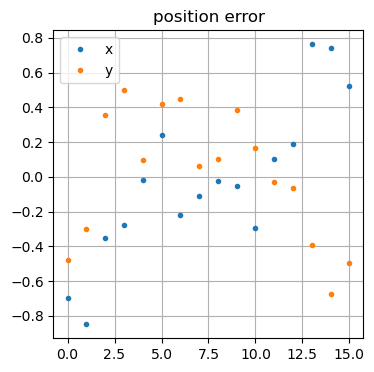

160) err=1.28526e+03


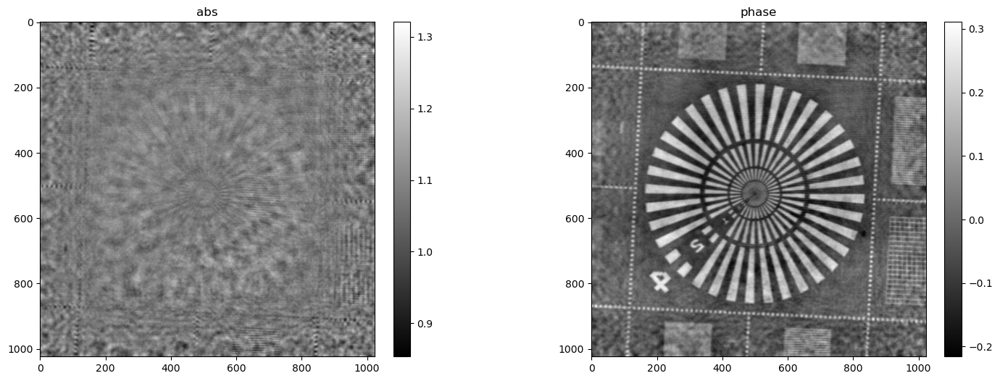

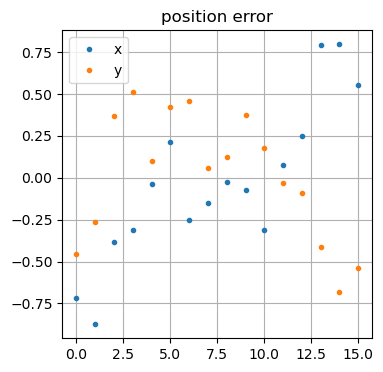

192) err=1.28166e+03


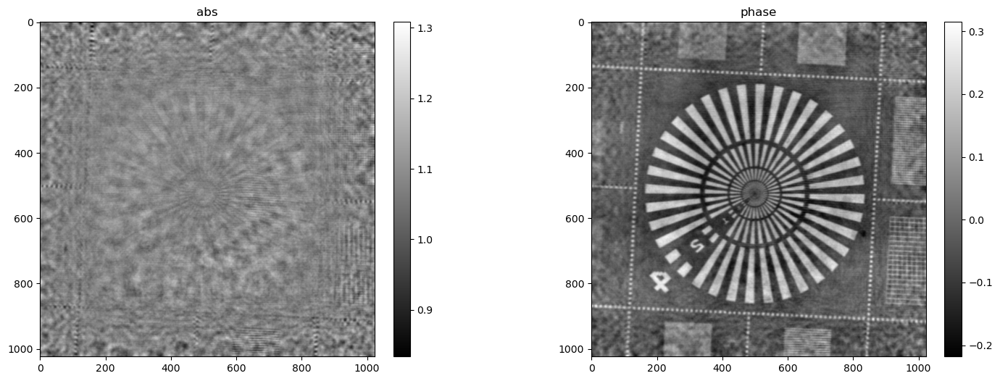

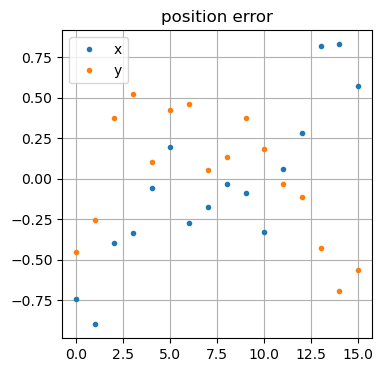

224) err=1.27837e+03


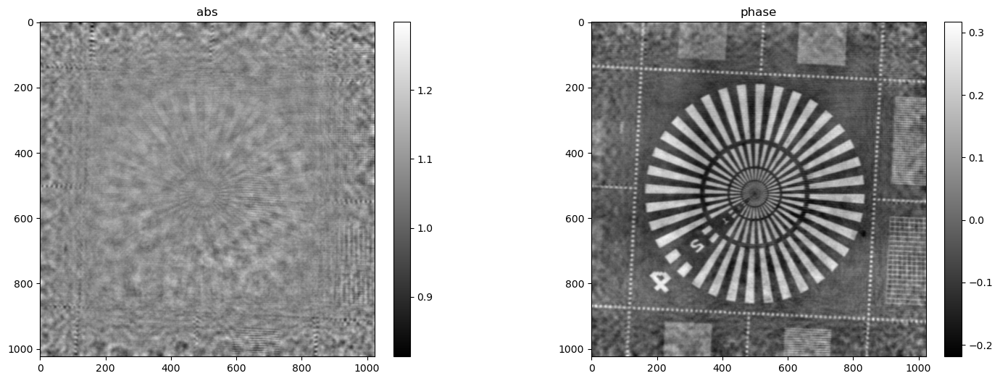

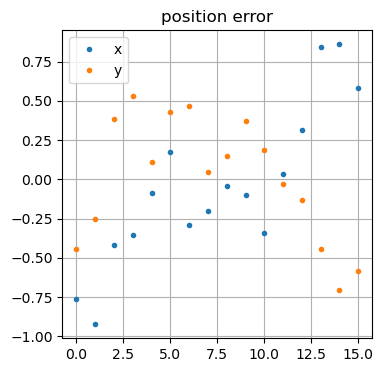

256) err=1.27604e+03


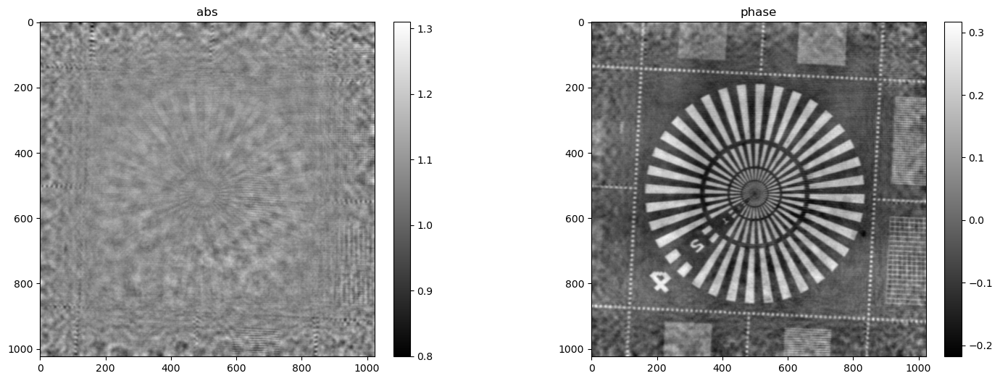

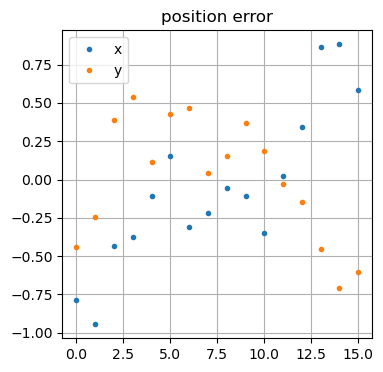

288) err=1.27414e+03


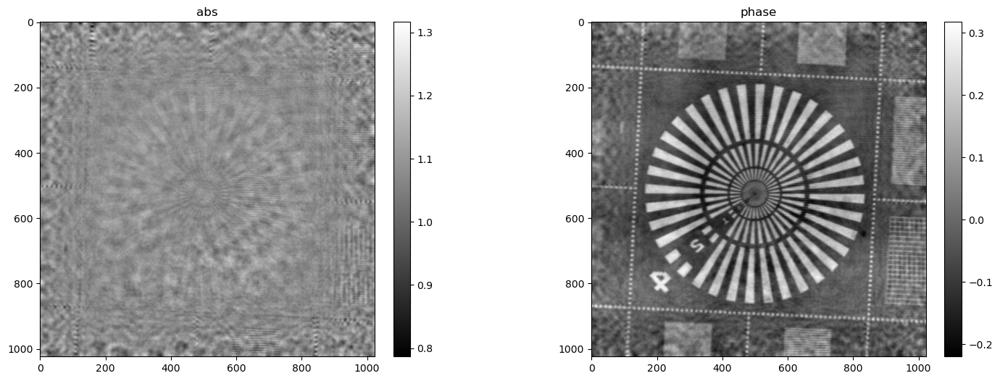

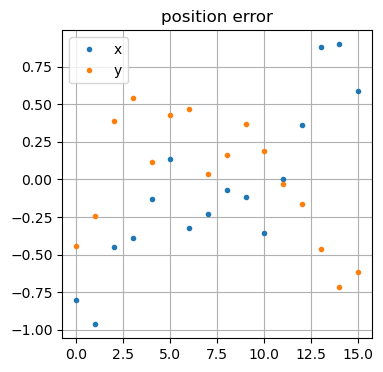

320) err=1.27224e+03


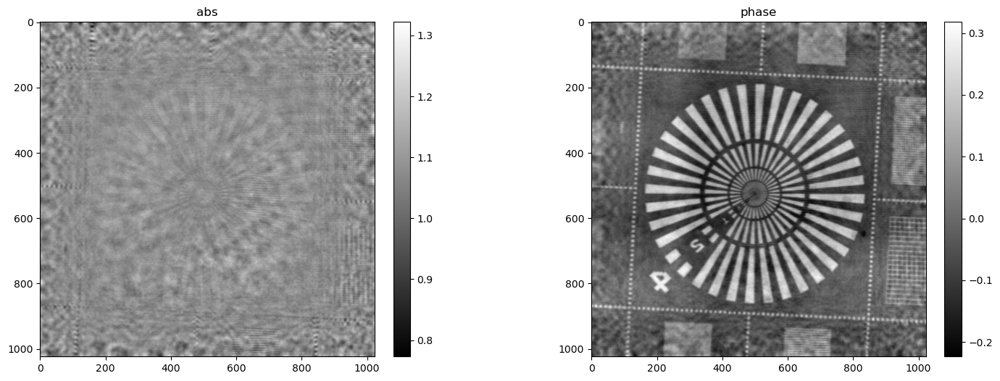

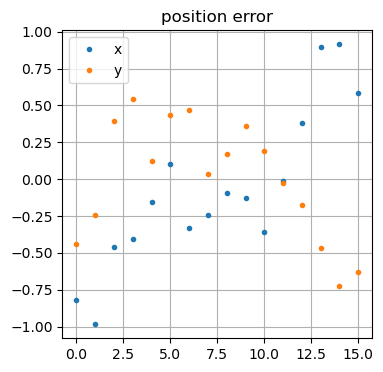

352) err=1.27080e+03


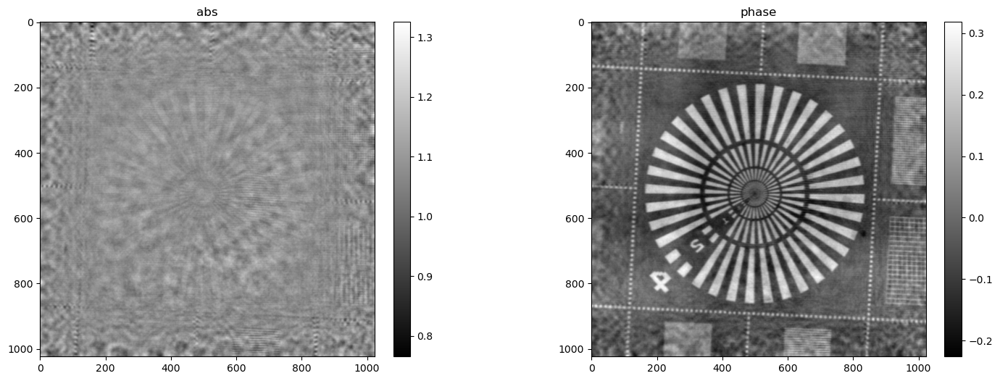

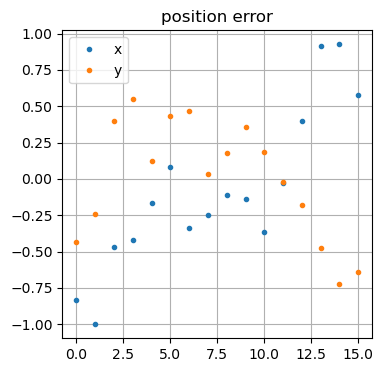

384) err=1.26953e+03


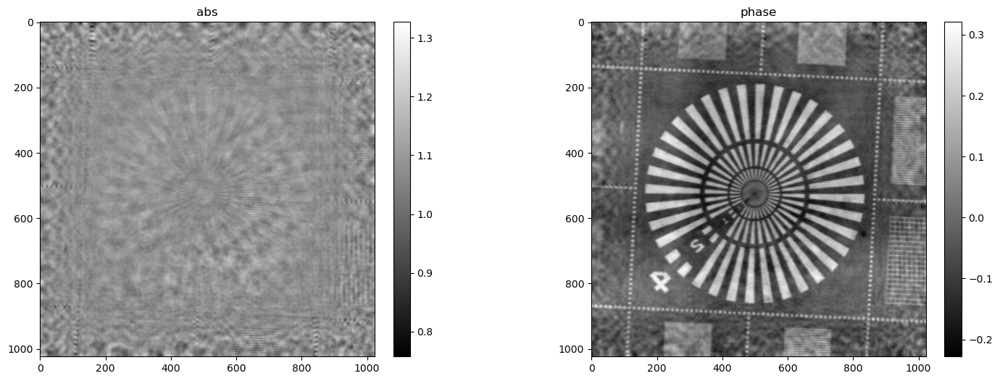

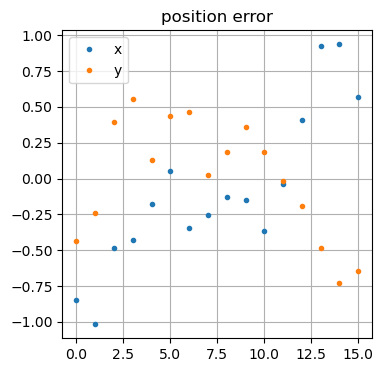

416) err=1.26827e+03


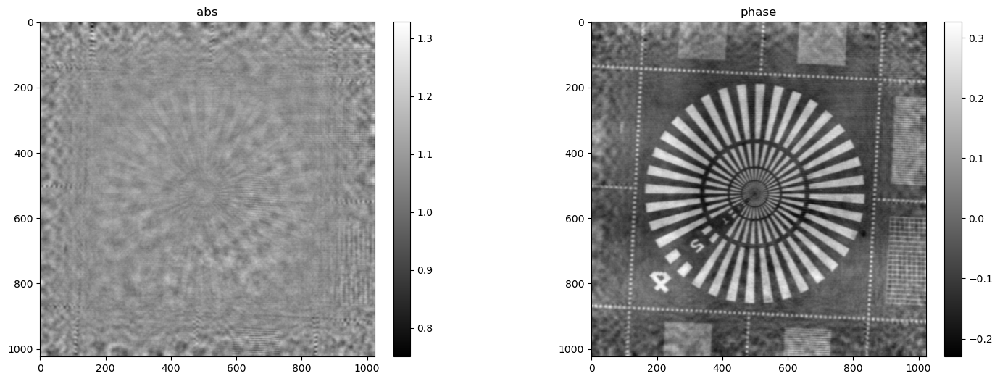

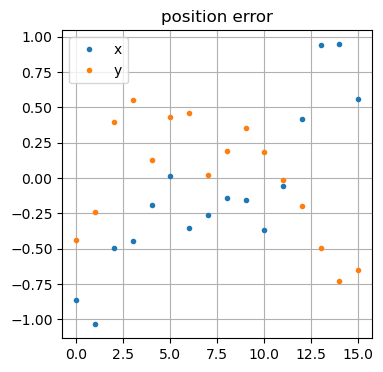

448) err=1.26715e+03


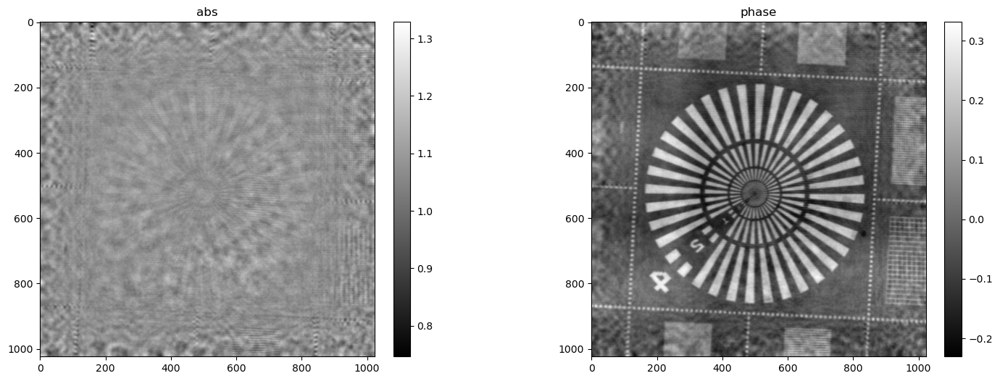

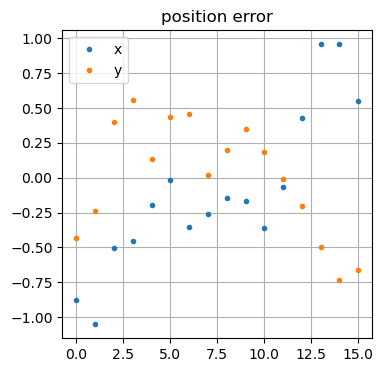

480) err=1.26634e+03


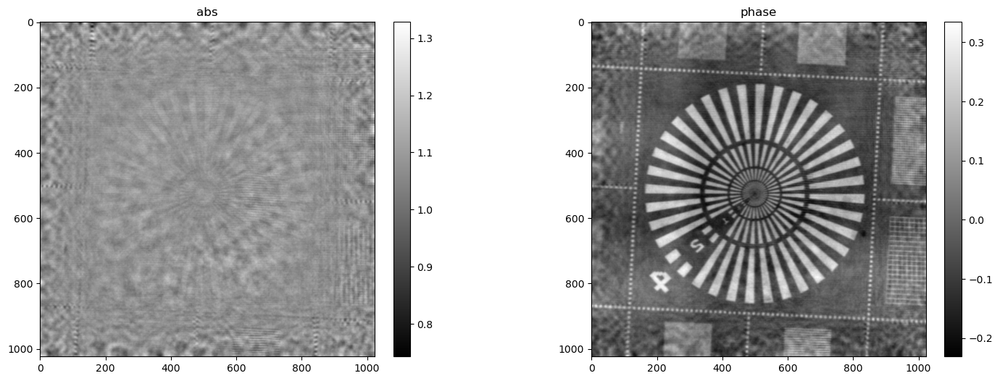

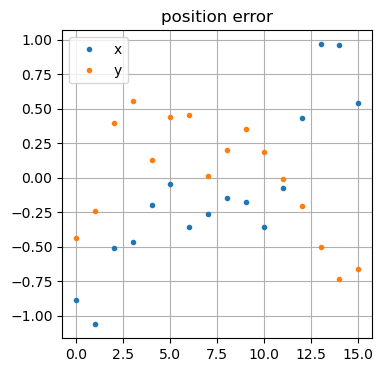

512) err=1.26557e+03


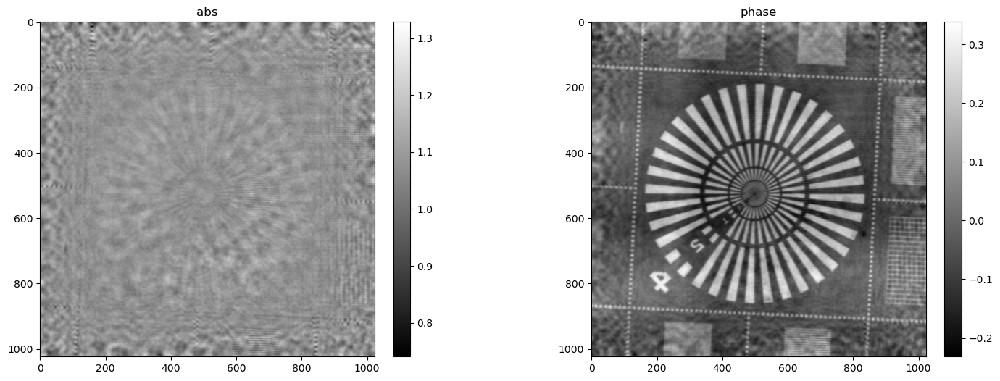

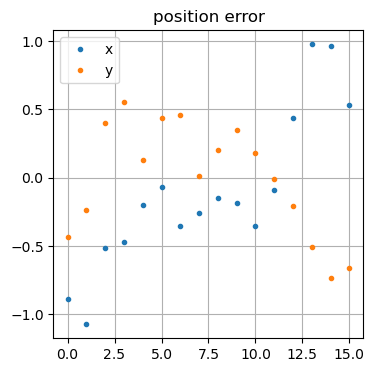

In [21]:
vars = {}    
vars["psi"] = cp.ones([args.npsi,args.npsi],dtype='complex64')
vars["q"] = cp.ones([args.n,args.n],dtype='complex64')
vars["ri"] = np.round(shifts).astype("int32")### initeger part of the shift
vars["r"] = np.array(shifts - vars["ri"]).astype("float32")### floating part of the shift
vars["r_init"] = np.array(shifts - vars["ri"]).astype("float32")
vars["table"] = pd.DataFrame(columns=["iter", "err", "time"])
# reconstruction
vars = cl_rec.BH(data, vars)


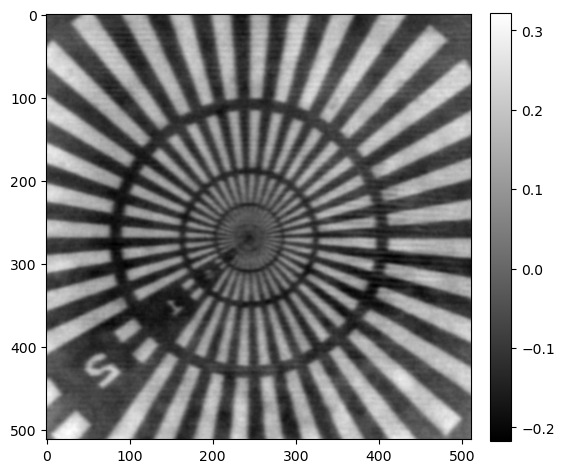

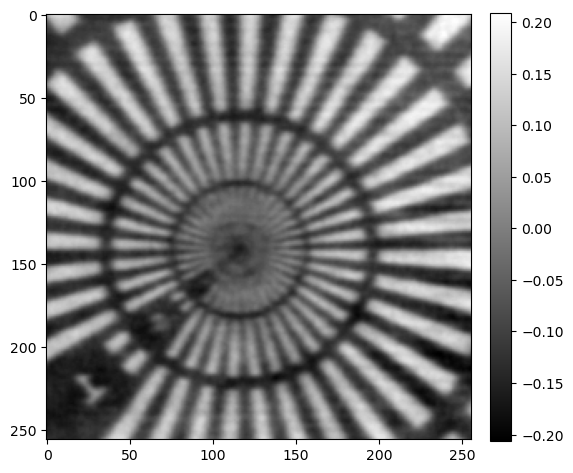

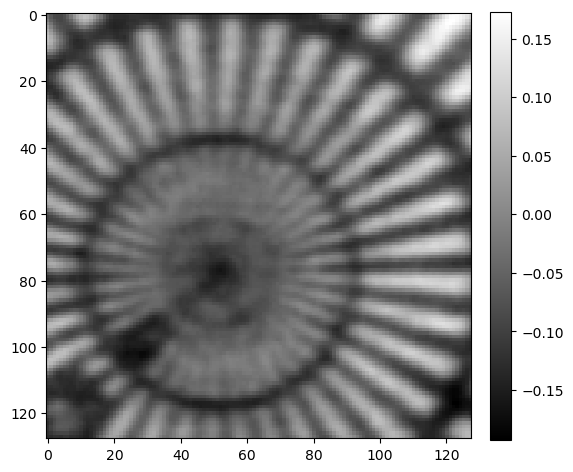

In [22]:
mshow(cp.angle(vars['q'][n//2-n//4:n//2+n//4,n//2-n//4:n//2+n//4]))
mshow(cp.angle(vars['q'][n//2-n//8:n//2+n//8,n//2-n//8:n//2+n//8]))
mshow(cp.angle(vars['q'][n//2-n//16:n//2+n//16,n//2-n//16:n//2+n//16]))